In [3]:
import pandas as pd 
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt


In [4]:
df_train = pd.read_csv('pp_train.csv', index_col=0)
df_test = pd.read_csv('pp_test.csv', index_col=0)

A continuación se muestra la estructura de los valores y medidas de posición, dispersión y simetria

In [44]:
df_train['time'] = pd.to_datetime(df_train['time'])

In [5]:
df_train.time.iloc[1]

'2011-01-01'

In [6]:
df_train.info("all")

<class 'pandas.core.frame.DataFrame'>
Index: 980562 entries, 0 to 980561
Data columns (total 25 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   t2m_obs           908857 non-null  float64
 1   time              980562 non-null  object 
 2   station           980562 non-null  int64  
 3   t2m_fc_mean       980562 non-null  float64
 4   orog              980562 non-null  float64
 5   station_alt       980562 non-null  float64
 6   station_lat       980562 non-null  float64
 7   station_lon       980562 non-null  float64
 8   u_pl500_fc_mean   980562 non-null  float64
 9   v_pl500_fc_mean   980562 non-null  float64
 10  gh_pl500_fc_mean  980562 non-null  float64
 11  u_pl850_fc_mean   980562 non-null  float64
 12  v_pl850_fc_mean   980562 non-null  float64
 13  q_pl850_fc_mean   980562 non-null  float64
 14  cape_fc_mean      980562 non-null  float64
 15  sp_fc_mean        980562 non-null  float64
 16  tcc_fc_mean       980562 

In [7]:
df_test.info("all")

<class 'pandas.core.frame.DataFrame'>
Index: 182218 entries, 0 to 182217
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   time              182218 non-null  object 
 1   station           182218 non-null  int64  
 2   t2m_fc_mean       182218 non-null  float64
 3   orog              182218 non-null  float64
 4   station_alt       182218 non-null  float64
 5   station_lat       182218 non-null  float64
 6   station_lon       182218 non-null  float64
 7   u_pl500_fc_mean   182218 non-null  float64
 8   v_pl500_fc_mean   182218 non-null  float64
 9   gh_pl500_fc_mean  182218 non-null  float64
 10  u_pl850_fc_mean   182218 non-null  float64
 11  v_pl850_fc_mean   182218 non-null  float64
 12  q_pl850_fc_mean   182218 non-null  float64
 13  cape_fc_mean      182218 non-null  float64
 14  sp_fc_mean        182218 non-null  float64
 15  tcc_fc_mean       182218 non-null  float64
 16  sshf_fc_mean      182218 

In [8]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
t2m_obs,908857.00,7.53,6.58,-26.20,2.80,7.80,12.50,30.40
station,980562.00,3726.73,2719.50,3.00,1639.00,3348.00,5277.00,15555.00
t2m_fc_mean,980562.00,7.31,6.72,-21.51,2.33,7.68,12.49,26.24
orog,980562.00,295.23,234.16,-1.43,67.39,296.44,436.71,1268.07
station_alt,980562.00,289.70,278.96,0.00,72.00,238.00,440.00,2964.00
station_lat,980562.00,50.81,1.92,47.40,49.24,50.74,52.18,55.01
station_lon,980562.00,10.18,2.08,6.02,8.58,10.05,11.81,14.95
u_pl500_fc_mean,980562.00,8.82,10.80,-34.02,1.47,8.57,15.72,53.23
v_pl500_fc_mean,980562.00,-0.30,10.91,-51.87,-6.88,0.30,7.20,37.15
gh_pl500_fc_mean,980562.00,5607.32,148.72,4976.94,5507.76,5629.72,5719.49,5940.68


In [9]:
df_test.describe().T

,count,mean,std,min,25%,50%,75%,max
station,182218.00,3726.97,2675.14,44.00,1645.00,3362.00,5280.00,15555.00
t2m_fc_mean,182218.00,7.49,6.72,-21.57,1.88,7.04,13.46,23.76
orog,182218.00,295.86,233.73,-1.43,66.49,296.44,436.94,1268.07
station_alt,182218.00,290.21,274.89,0.00,70.00,240.00,443.00,2964.00
station_lat,182218.00,50.81,1.91,47.40,49.24,50.73,52.21,55.01
station_lon,182218.00,10.25,2.09,6.02,8.64,10.17,11.88,14.95
u_pl500_fc_mean,182218.00,8.52,10.64,-30.60,1.77,7.95,14.96,58.53
v_pl500_fc_mean,182218.00,-0.80,10.35,-47.70,-7.08,-0.16,6.05,34.92
gh_pl500_fc_mean,182218.00,5604.43,159.33,5135.72,5499.19,5630.70,5720.52,5942.31
u_pl850_fc_mean,182218.00,4.43,7.36,-19.00,-0.35,4.21,8.89,34.70


Los datos trabajados tiene la siguiente forma, donde los datos de train no tienen la variable objetivo o target

In [10]:
print(df_test.shape)
print(df_train.shape)

(182218, 24)
(980562, 25)


In [11]:
df_train.columns

Index(['t2m_obs', 'time', 'station', 't2m_fc_mean', 'orog', 'station_alt',
       'station_lat', 'station_lon', 'u_pl500_fc_mean', 'v_pl500_fc_mean',
       'gh_pl500_fc_mean', 'u_pl850_fc_mean', 'v_pl850_fc_mean',
       'q_pl850_fc_mean', 'cape_fc_mean', 'sp_fc_mean', 'tcc_fc_mean',
       'sshf_fc_mean', 'slhf_fc_mean', 'u10_fc_mean', 'v10_fc_mean',
       'ssr_fc_mean', 'str_fc_mean', 'd2m_fc_mean', 'sm_fc_mean'],
      dtype='object')

Etapa de cleaning

In [12]:
df_train.isna().sum()

t2m_obs             71705
time                    0
station                 0
t2m_fc_mean             0
orog                    0
station_alt             0
station_lat             0
station_lon             0
u_pl500_fc_mean         0
v_pl500_fc_mean         0
gh_pl500_fc_mean        0
u_pl850_fc_mean         0
v_pl850_fc_mean         0
q_pl850_fc_mean         0
cape_fc_mean            0
sp_fc_mean              0
tcc_fc_mean             0
sshf_fc_mean            0
slhf_fc_mean            0
u10_fc_mean             0
v10_fc_mean             0
ssr_fc_mean             0
str_fc_mean             0
d2m_fc_mean             0
sm_fc_mean          93962
dtype: int64

<Axes: xlabel='Temperatura', ylabel='Frequency'>

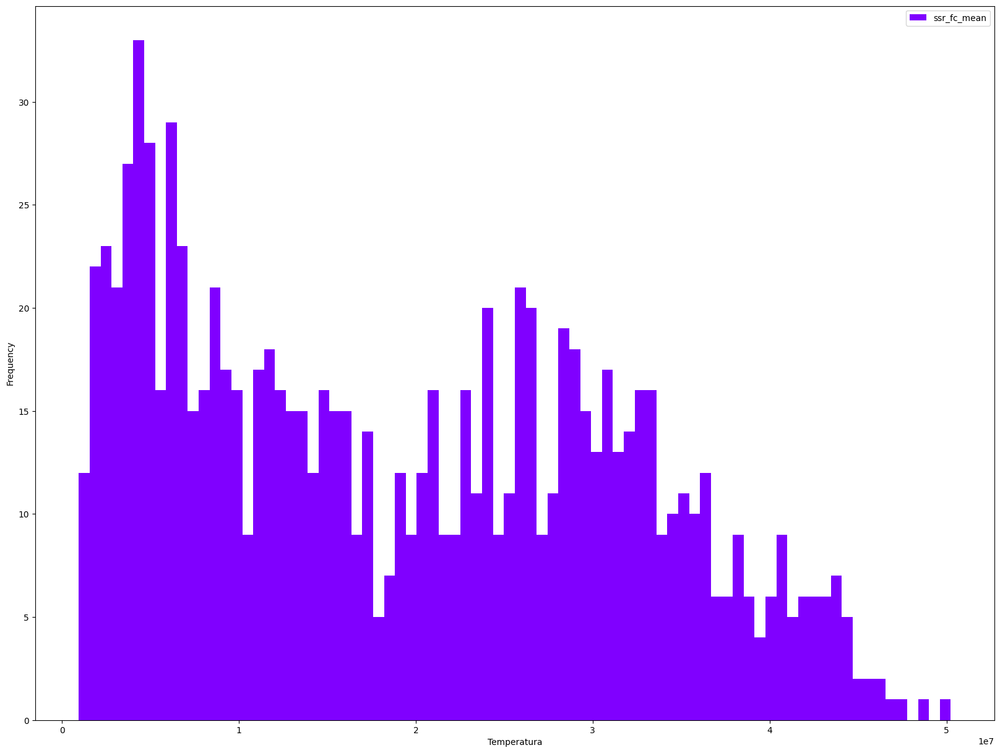

In [19]:
df_train[::1000].loc[:,['ssr_fc_mean']].plot(kind="hist", bins=80,xlabel="Temperatura", colormap="rainbow",figsize=(20,15))
# df_train[::1000].plot(kind="hist", bins=80,xlabel="Temperatura", colormap="rainbow",figsize=(20,15))
# sb.histplot(df_train[::1000])

De una forma generalizada podemos apreciar las correlaciones encontradas entre las diferentes variables

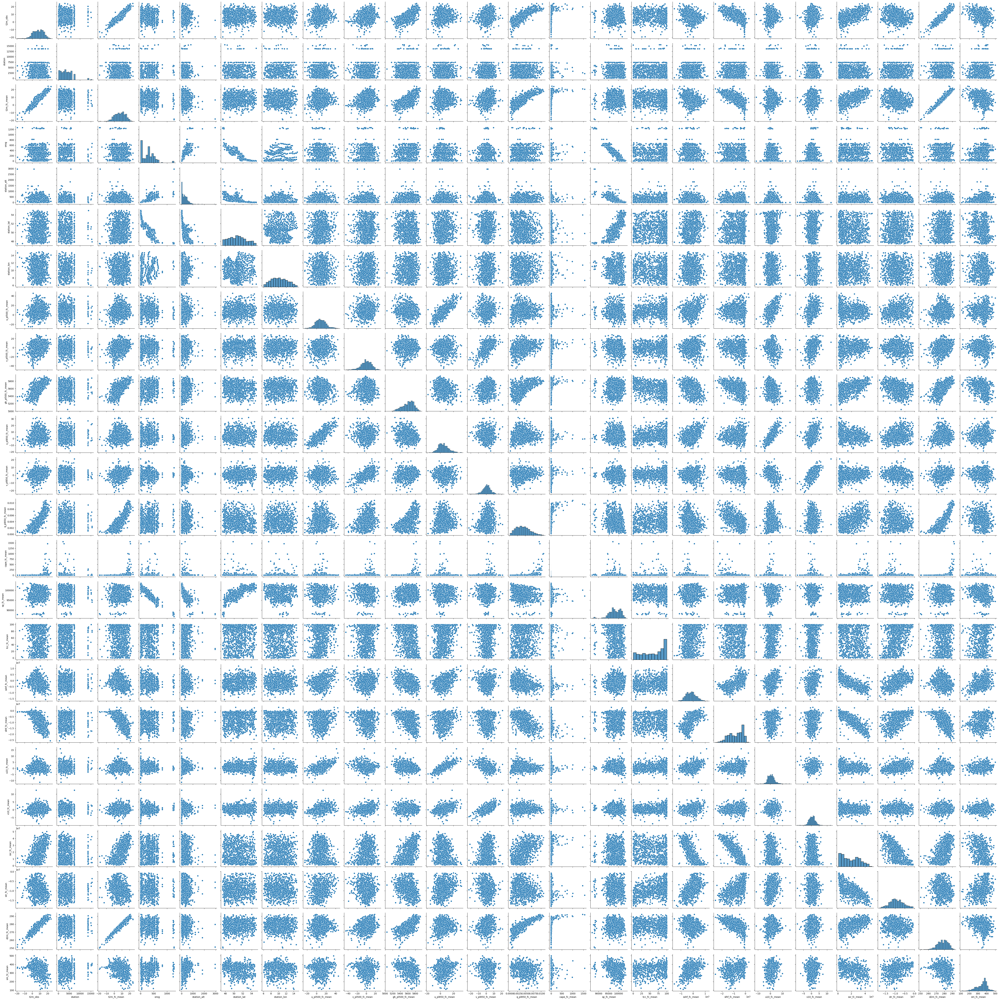

In [72]:
sb.pairplot(df_train[::1000])